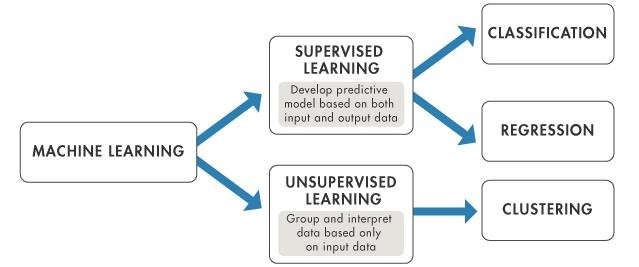

# **TASK #1: UNDERSTAND THE PROBLEM STATEMENT AND BUSINESS CASE**

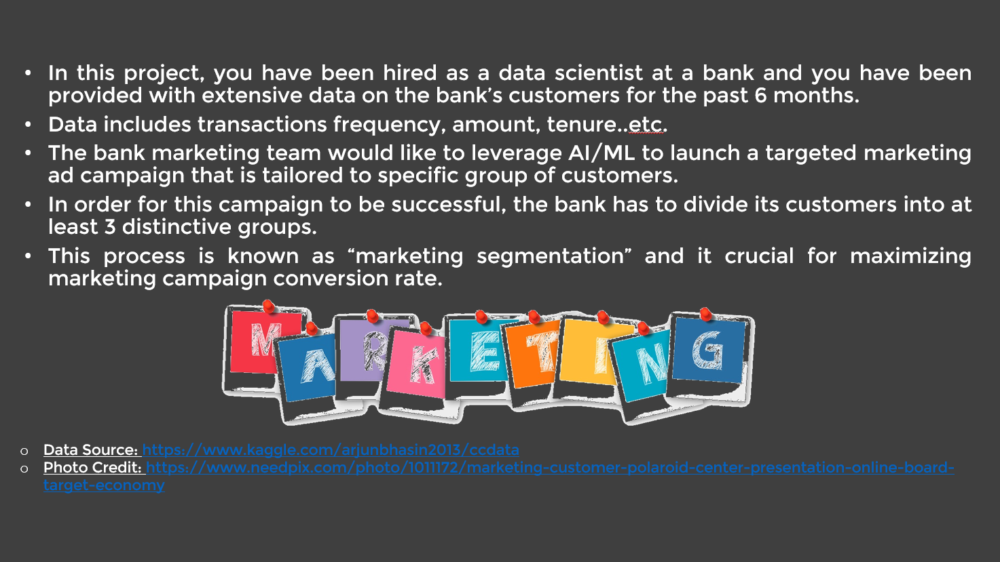

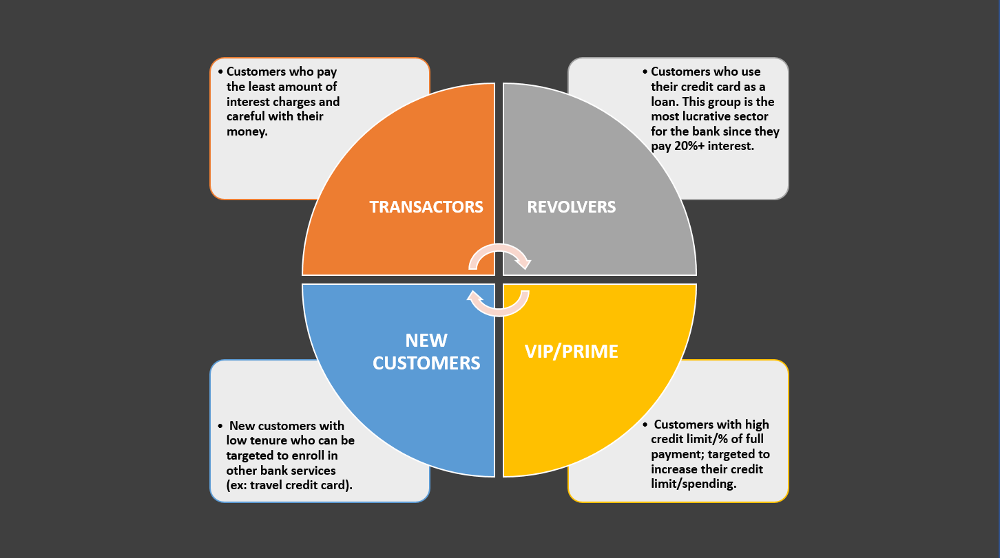

# **TASK #2: IMPORT LIBRAIRIES AND DATASETS**

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from pandas_profiling import ProfileReport
%matplotlib inline

In [3]:
from pycaret.clustering import *

In [4]:
from yellowbrick.cluster import KElbowVisualizer

In [5]:
creditcard_df = pd.read_csv('marketing_data.csv')
# CUSTID: Identification of Credit Card holder 
# BALANCE: Balance amount left in customer's account to make purchases
# BALANCE_FREQUENCY: How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
# PURCHASES: Amount of purchases made from account
# ONEOFFPURCHASES: Maximum purchase amount done in one-go
# INSTALLMENTS_PURCHASES: Amount of purchase done in installment
# CASH_ADVANCE: Cash in advance given by the user
# PURCHASES_FREQUENCY: How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
# ONEOFF_PURCHASES_FREQUENCY: How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
# PURCHASES_INSTALLMENTS_FREQUENCY: How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
# CASH_ADVANCE_FREQUENCY: How frequently the cash in advance being paid
# CASH_ADVANCE_TRX: Number of Transactions made with "Cash in Advance"
# PURCHASES_TRX: Number of purchase transactions made
# CREDIT_LIMIT: Limit of Credit Card for user
# PAYMENTS: Amount of Payment done by user
# MINIMUM_PAYMENTS: Minimum amount of payments made by user  
# PRC_FULL_PAYMENT: Percent of full payment paid by user
# TENURE: Tenure(mandat) of credit card service for user

In [6]:
creditcard_df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [6]:
profile = ProfileReport(creditcard_df, title='Pandas Profiling Report')
profile.to_file("Credit_card.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Pycaret Clustering

In [7]:
data = creditcard_df.sample(frac=0.95, random_state=786)
data_unseen = creditcard_df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (8502, 18)
Unseen Data For Predictions: (448, 18)


In [8]:
credit_cluster = setup(data, normalize = True, 
                   ignore_features = ['CUST_ID'],
                   session_id = 123)

,Description,Value
0,session_id,123
1,Original Data,"(8502, 18)"
2,Missing Values,True
3,Numeric Features,16
4,Categorical Features,1
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(8502, 23)"
9,CPU Jobs,-1


In [9]:
# setup() returns a tuple of global variables
# retrieve the transformed dataset
transformed_data = get_config('X')

In [10]:
transformed_data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,...,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE_10,TENURE_11,TENURE_12,TENURE_6,TENURE_7,TENURE_8,TENURE_9
0,-0.385994,0.51752,0.223352,0.478900,-0.353791,-0.467613,0.856260,2.114795,-0.284546,-0.678269,...,-0.214969,-0.302926,-0.525146,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0.335512,0.51752,-0.464290,-0.353514,-0.448360,-0.431420,-1.217083,-0.678789,-0.913103,-0.263267,...,-0.390825,-0.083461,-0.525146,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,-0.394084,0.51752,-0.427202,-0.305849,-0.448360,-0.235858,-0.802413,-0.120071,-0.913103,0.566742,...,-0.521659,0.668975,-0.525146,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-0.649273,0.51752,0.660462,0.644831,0.375518,-0.467613,1.270930,2.673513,0.763050,-0.678269,...,0.096867,-0.297815,2.900288,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,-0.433014,0.51752,1.819163,1.011785,2.443097,-0.467613,1.270930,2.394156,1.601125,-0.678269,...,1.069206,-0.294941,2.900288,0.0,0.0,1.0,0.0,0.0,0.0,0.0


# **TASK #4: UNDERSTAND THE THEORY AND INTUITION BEHIND K-MEANS**

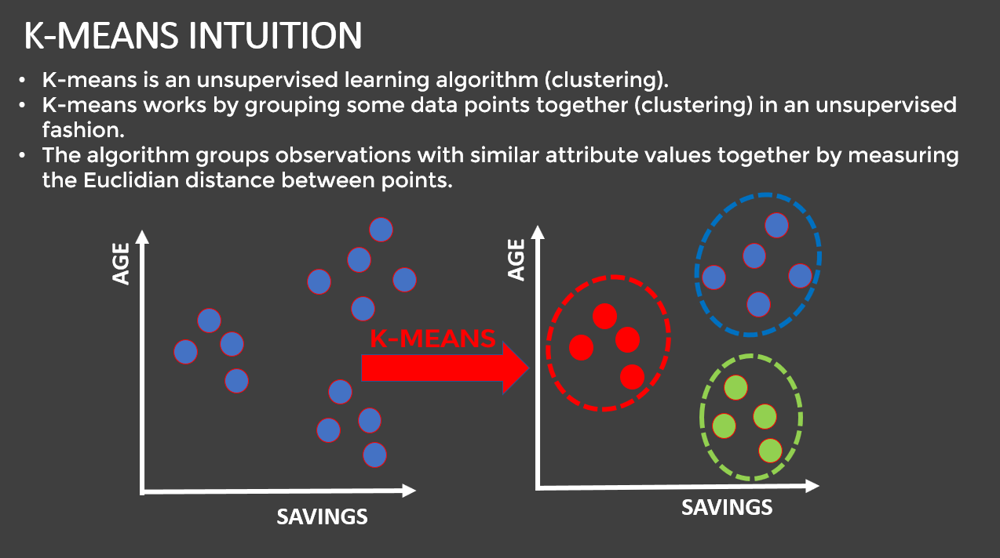

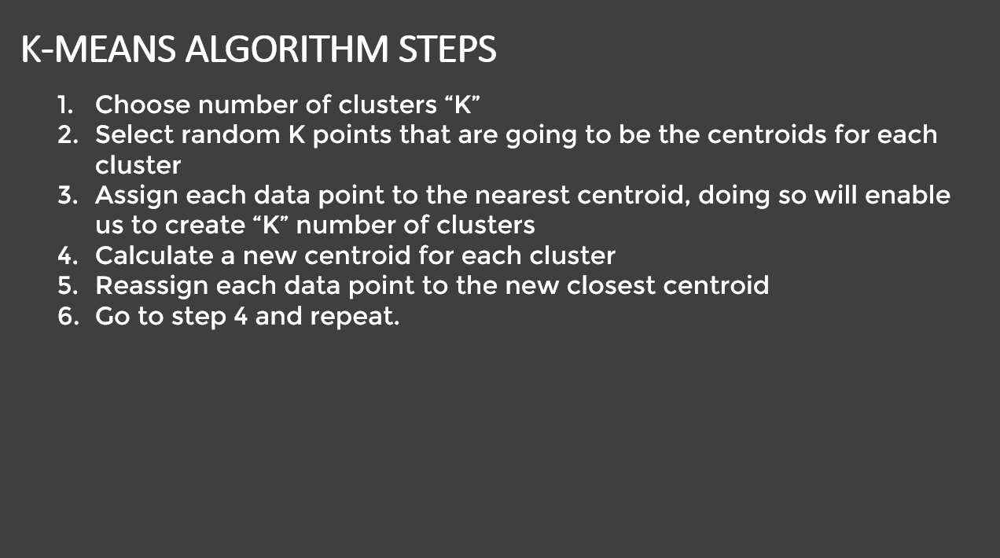

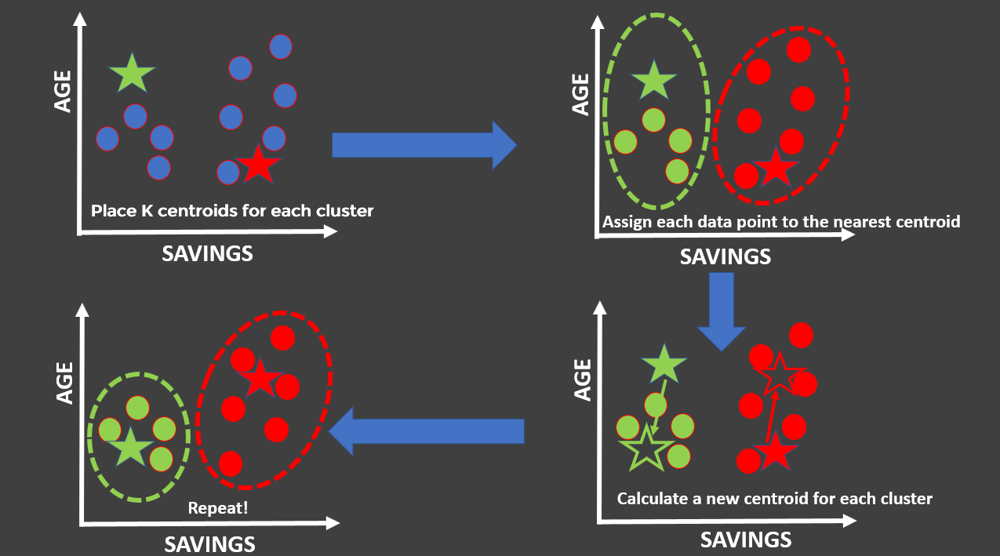

***RQ: K-means terminates after a fixed number of iterations is reached or when the centroid locations do not change between iterations***

# **TASK #5: LEARN HOW TO OBTAIN THE OPTIMAL NUMBER OF CLUSTERS(ELBOW METHOD)**

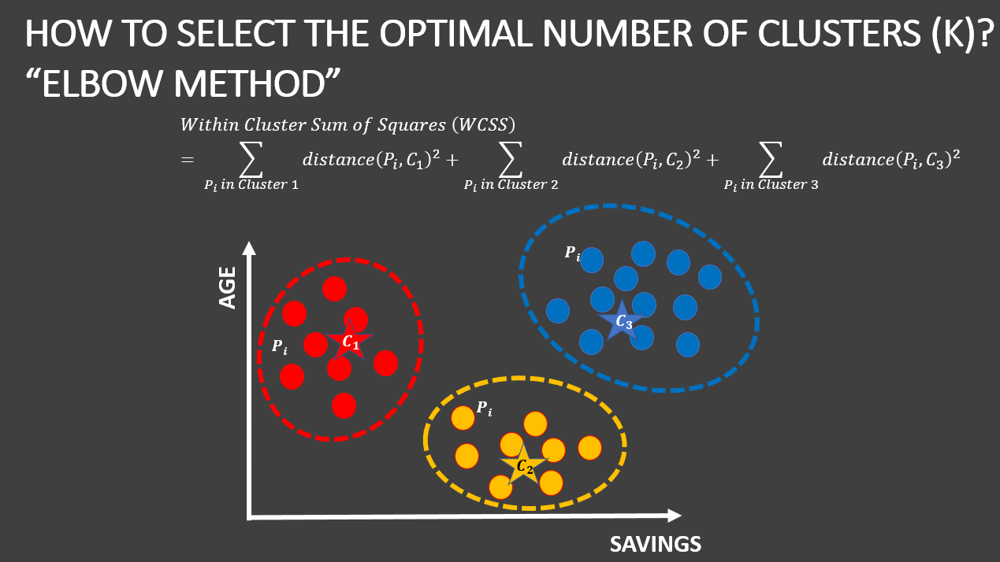

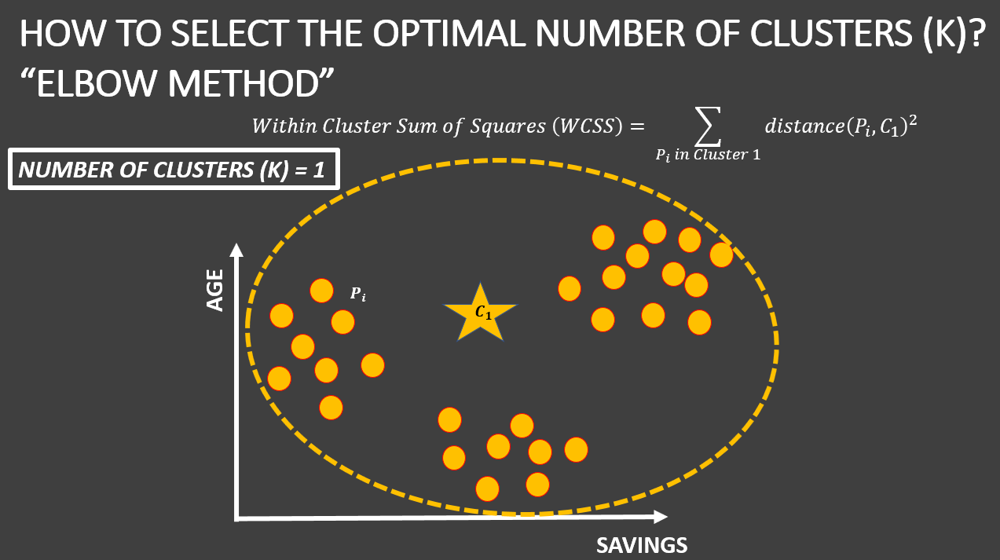

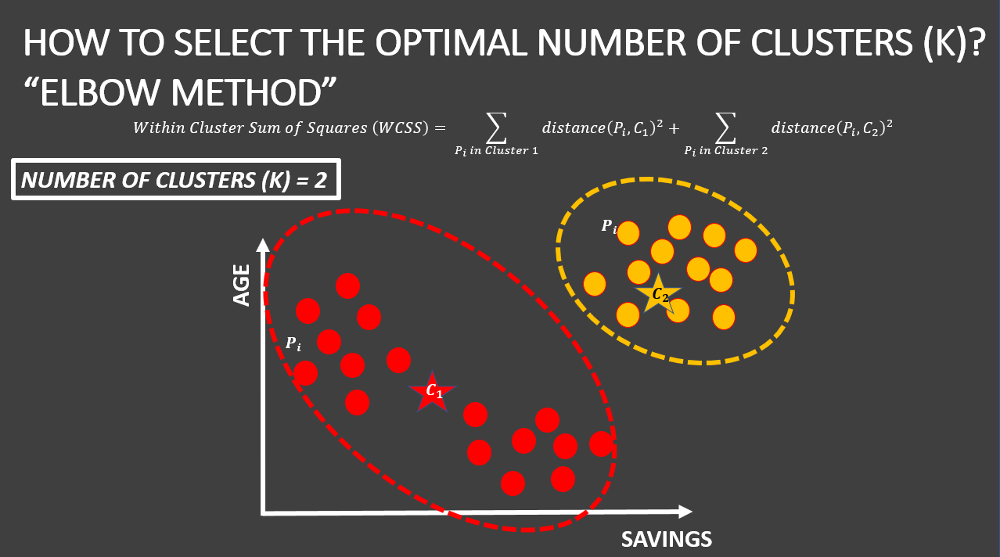

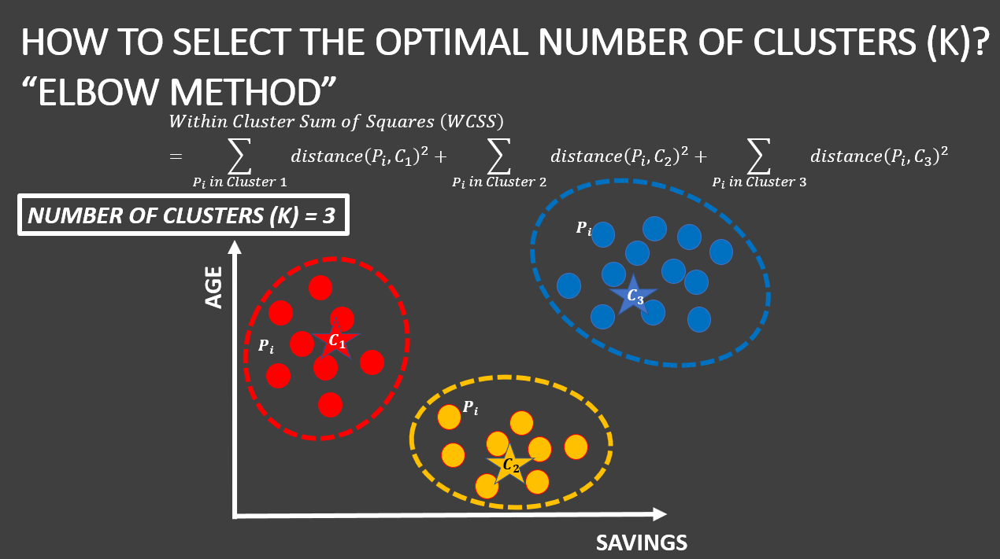

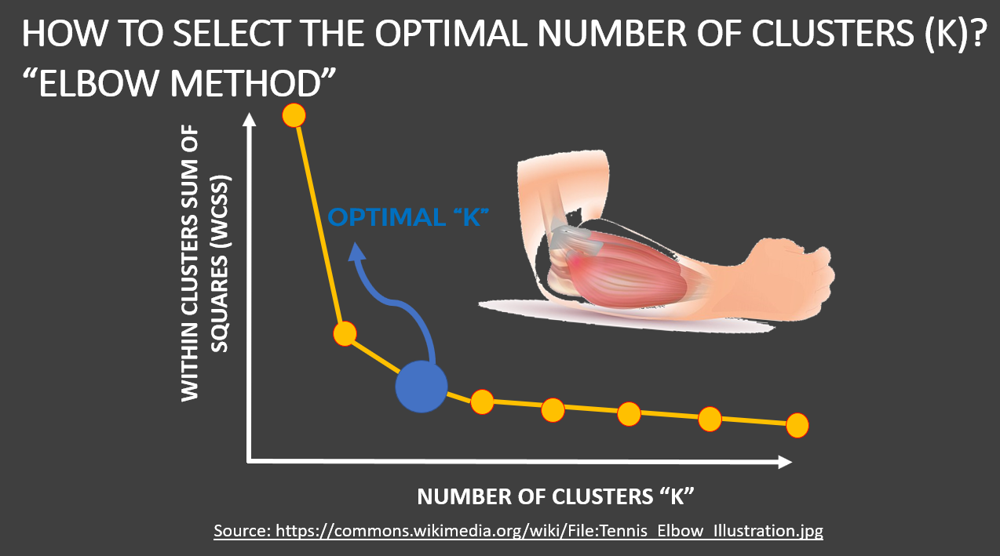

## silouhette score

**Silhouette score is used to evaluate the quality of clusters created using clustering algorithms such as K-Means in terms of how well samples are clustered with other samples that are similar to each other. The Silhouette score is calculated for each sample of different clusters. 
To calculate the Silhouette score for each observation/data point, the following distances need to be found out for each observations belonging to all the clusters:**

* **Mean distance between the observation and all other data points in the same cluster**. This distance can also be called a **mean intra-cluster distance**. The mean distance is denoted by a
* **Mean distance between the observation and all other data points of the next nearest cluster**. This distance can also be called a **mean nearest-cluster distance**. The mean distance is denoted by b

Silhouette score, S, for each sample is calculated using the following formula:

**S = (b-a)/max(a,b)**

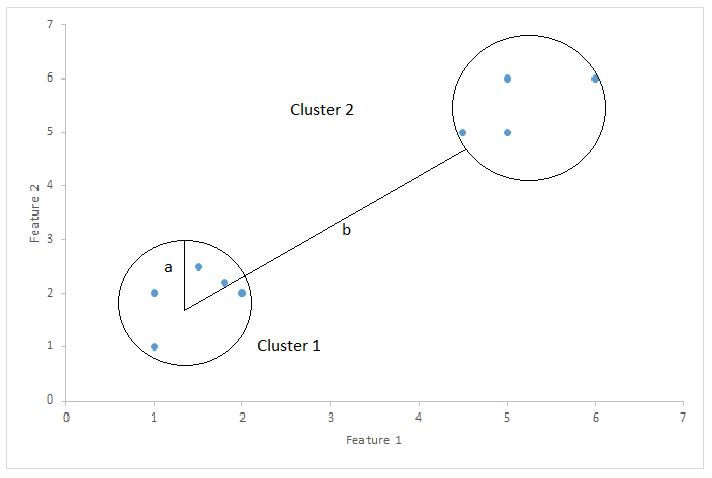

In [21]:
# check for available models
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [11]:
# create kmeans model with default number of clusters =4
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2135,1622.8112,1.487,0,0,0


In [30]:
print(kmeans)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0)


# **TASK #6: FIND THE OPTIMAL NUMBER OF CLUSTERS USING ELBOW METHOD**


*   The elbow method is a heuristic method of interpretation and validation of consistency within cluster analysis designed to help find the appropriate number of clusters in a dataset. 
*   if the line chart looks like an arm then the "elbow" on the arm is the value of k that is the best



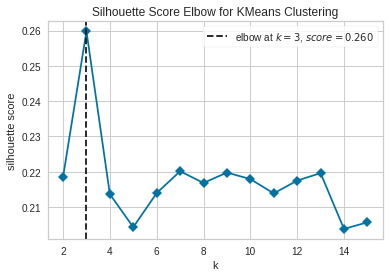

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [25]:
# Instantiate the clustering model and visualizer
#model = KMeans()
visualizer = KElbowVisualizer(
    model, k=(2,16), metric='silhouette', timings=False)

visualizer.fit(transformed_data)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

In [29]:
# even the best number of clusters is 3 , we'll follow the business goals to cluster the data into 4 groups

# **TASK #7: APPLY K-MEANS METHOD**

In [31]:
kmean_results = assign_model(kmeans)
kmean_results.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,C15646,765.966137,1.0,1488.82,1402.35,86.47,0.000000,0.833333,0.833333,0.250000,0.000000,0,24,4000.0,1111.593127,181.840836,0.0,12,Cluster 1
1,C15604,2267.664008,1.0,0.00,0.00,0.00,76.590404,0.000000,0.000000,0.000000,0.083333,1,0,2500.0,597.046672,673.465761,0.0,12,Cluster 2
2,C11163,749.127741,1.0,80.30,80.30,0.00,490.432946,0.166667,0.166667,0.000000,0.250000,4,3,1950.0,214.230371,2359.005614,0.0,12,Cluster 2
3,C15125,217.993205,1.0,2435.21,1681.89,753.32,0.000000,1.000000,1.000000,0.666667,0.000000,0,30,7500.0,2024.009974,193.289032,1.0,12,Cluster 1
4,C11511,668.102701,1.0,4943.92,2300.09,2643.83,0.000000,1.000000,0.916667,1.000000,0.000000,0,52,7000.0,4869.034025,199.727571,1.0,12,Cluster 1


# **TASK 8: APPLY PRINCIPAL COMPENENT ANALYSIS AND VISUALIZE THE RESULTS**

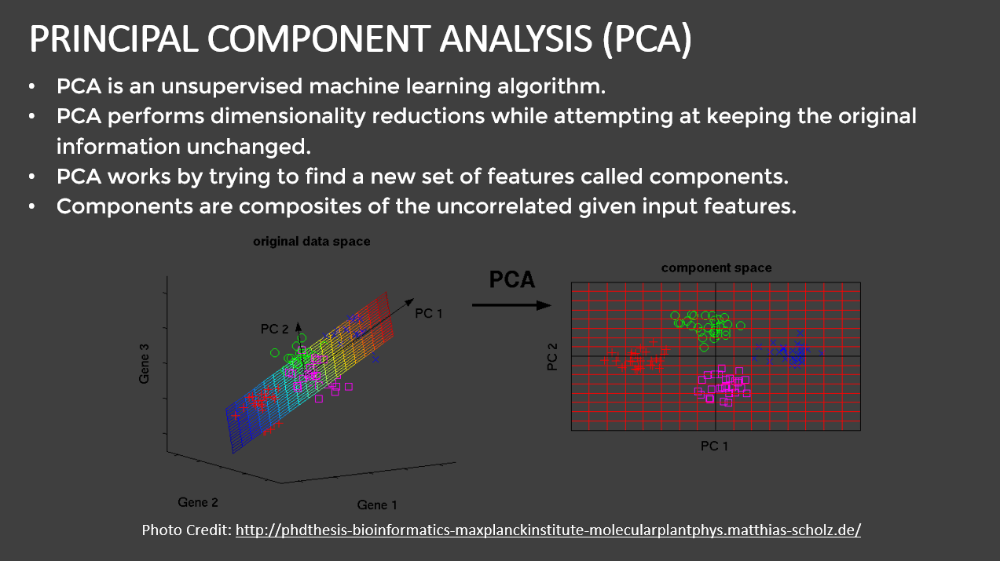

In [12]:
plot_model(kmeans)

In [13]:
plot_model(kmeans, plot = 'distribution') #to see size of clusters

In [39]:

#First Custmers cluster (Transactors): they pay least amount of interest charges and careful with their money , Cluster with lowest balance ($104) and cash advance ($303), Percentage of full payment = 23%
# Second customers cluster (revolvers) who use credit card as a loan (most lucrative sector): highest balance ($5000) and cash advance (~$5000), low purchase frequency, high cash advance frequency (0.5), high cash advance transactions (16) and low percentage of full payment (3%)
# Third customer cluster (VIP/Prime): high credit limit $16K and highest percentage of full payment, target for increase credit limit and increase spending habits
# Fourth customer cluster (low tenure): these are customers with low tenure (7 years), low balance 




## Predict on unseen data

In [14]:
unseen_predictions = predict_model(kmeans, data=data_unseen)
unseen_predictions.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,Cluster 1
1,C10019,1989.072228,1.000000,504.35,166.00,338.35,0.000000,0.666667,0.083333,0.583333,0.000000,0,9,13000.0,1720.837373,744.613395,0.000000,12,Cluster 1
2,C10038,4047.480828,1.000000,2380.55,1642.17,738.38,1697.660901,0.750000,0.500000,0.750000,0.333333,7,41,5000.0,1617.894416,1541.141605,0.000000,12,Cluster 1
3,C10040,1411.602230,0.454545,963.24,963.24,0.00,6173.682877,0.083333,0.083333,0.000000,0.333333,6,6,7500.0,20071.075440,719.948985,0.333333,12,Cluster 0
4,C10059,2386.330629,1.000000,5217.62,4789.09,428.53,0.000000,0.916667,0.916667,0.500000,0.000000,0,42,7500.0,5678.729613,1311.514878,0.083333,12,Cluster 1


In [41]:
save_model(kmeans,'Customer_kmeans')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True,
                                       features_todrop=['CUST_ID'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='UNSUPERVISED_DUMMY_TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 fill_value_categorical=None,
                                 fill_value_numer...
                 ('fix_perfect', 'passthrough'),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 

In [15]:
saved_kmeans = load_model('Customer_kmeans')

Transformation Pipeline and Model Successfully Loaded


In [16]:
print(saved_kmeans)

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True,
                                      features_todrop=['CUST_ID'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='UNSUPERVISED_DUMMY_TARGET',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                                fill_value_categorical=None,
                                fill_value_numer...
                ('fix_perfect', 'passthrough'),
                ('clean_names', Clean_Colum_Names()),
                ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                ('dfs', 'passthrough'), ('pca', 'passthrough'),
                ['trained_model',


In [17]:
new_prediction = predict_model(saved_kmeans, data=data_unseen)


In [18]:
new_prediction

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,Cluster 1
1,C10019,1989.072228,1.000000,504.35,166.00,338.35,0.000000,0.666667,0.083333,0.583333,0.000000,0,9,13000.0,1720.837373,744.613395,0.000000,12,Cluster 1
2,C10038,4047.480828,1.000000,2380.55,1642.17,738.38,1697.660901,0.750000,0.500000,0.750000,0.333333,7,41,5000.0,1617.894416,1541.141605,0.000000,12,Cluster 1
3,C10040,1411.602230,0.454545,963.24,963.24,0.00,6173.682877,0.083333,0.083333,0.000000,0.333333,6,6,7500.0,20071.075440,719.948985,0.333333,12,Cluster 0
4,C10059,2386.330629,1.000000,5217.62,4789.09,428.53,0.000000,0.916667,0.916667,0.500000,0.000000,0,42,7500.0,5678.729613,1311.514878,0.083333,12,Cluster 1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,C19145,43.960637,1.000000,580.65,0.00,580.65,0.000000,1.000000,0.000000,0.857143,0.000000,0,7,1000.0,488.691925,103.514338,0.833333,7,Cluster 1
444,C19149,21.357267,1.000000,212.87,0.00,212.87,0.000000,1.000000,0.000000,0.857143,0.000000,0,7,1000.0,169.713838,103.387362,1.000000,7,Cluster 1
445,C19156,381.341657,1.000000,78.00,0.00,78.00,934.808869,1.000000,0.000000,0.833333,0.666667,16,6,1000.0,143.118373,85.152441,0.000000,6,Cluster 0
446,C19173,39.552396,1.000000,180.00,0.00,180.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,138.203240,86.564172,1.000000,6,Cluster 1
